In [2]:
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import os

# Data Preprocessing

## Load Data

In [3]:
data = pd.read_csv('../frontend/data/dataset.csv', index_col=0)
data.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [4]:
features = ['track_name', 'track_genre', 'artists', 'danceability', 'loudness', 'acousticness', 'valence', 'tempo']
X = data[features].copy()
X.drop_duplicates(subset=['track_name', 'artists'], keep='first', inplace=True)

## Standardize Data
Since danceability, acousticness, and valence are already on a \[0, 1\] scale, we just need to standardize the tempo and loudness data

In [5]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[['danceability', 'acousticness', 'valence', 'tempo', 'loudness']])

In [6]:
X_scaled

array([[ 0.65670142, -0.87501785,  0.95572265, -1.13606092,  0.34835697],
       [-0.78356832,  1.74824015, -0.74523169, -1.48217614, -1.62893418],
       [-0.68229935, -0.35201351, -1.30335734, -1.52057807, -0.21491369],
       ...,
       [ 0.39227689,  1.58057284,  1.0620323 ,  0.33964185, -0.43377488],
       [ 0.15598264,  0.15098842, -0.19090282,  0.45853183, -0.43264382],
       [-0.18720663,  1.03344794,  0.92914524, -1.42545281, -0.30351383]])

# K-Means - Euclidean Distance

In [11]:
kmeans = KMeans(n_clusters=9, init="k-means++", random_state=42)

In [12]:
clusters = kmeans.fit_predict(X_scaled)

In [13]:
results = X.copy()  # create a copy of the original data, which includes the song name and genre
results['clusters'] = clusters.astype(str)  # add the predicted clusters to each data point
results.head()

,track_name,track_genre,artists,danceability,loudness,acousticness,valence,tempo,clusters
0,Comedy,acoustic,Gen Hoshino,0.676,-6.746,0.0322,0.715,87.917,0
1,Ghost - Acoustic,acoustic,Ben Woodward,0.420,-17.235,0.9240,0.267,77.489,3
2,To Begin Again,acoustic,Ingrid Michaelson;ZAYN,0.438,-9.734,0.2100,0.120,76.332,2
3,Can't Help Falling In Love,acoustic,Kina Grannis,0.266,-18.515,0.9050,0.143,181.740,4
4,Hold On,acoustic,Chord Overstreet,0.618,-9.681,0.4690,0.167,119.949,5


## Plot Clusters
First, perform PCA on the grouped data  
Then, plot and color based on their cluster

In [14]:
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

In [15]:
# add components to each data point
results['pca1'] = components[:, 0]
results['pca2'] = components[:, 1]

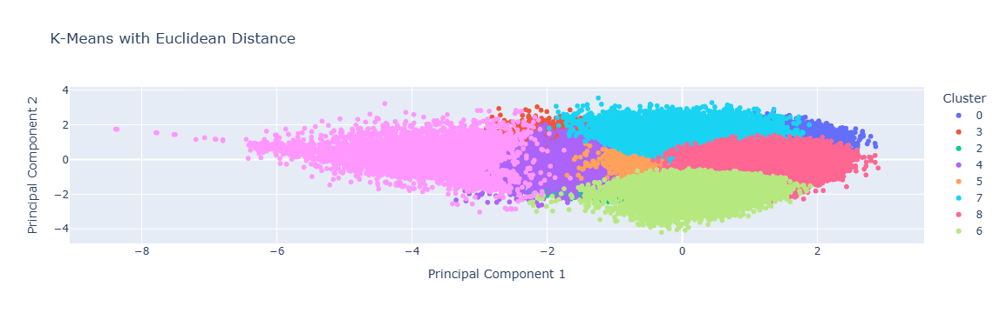

In [17]:
fig = px.scatter(results, x='pca1', y='pca2', color='clusters', labels={'clusters': 'Cluster', 'pca1': 'Principal Component 1', 'pca2': 'Principal Component 2'}, hover_data=['track_name', 'track_genre'], title='K-Means with Euclidean Distance')
fig.show()

## Plot Two Clusters Against Each Other

In [60]:
group1 = results[results['clusters'].isin(['1', '2'])]

fig = px.scatter_3d(group1, x='pca1', y='pca2', z='pca3', color='clusters', labels={'clusters': 'Cluster'}, hover_data=['track_name', 'track_genre', 'acousticness', 'valence', 'tempo', 'loudness', 'danceability'], title='Clusters Visualized with PCA (3 Components)')
fig.show(renderer='iframe')

# K-Means - Cosine Distance
In order to use the distance metric of $1-\cos \theta$, where $\cos \theta=\frac{x\cdot y}{\lVert x \rVert\lVert y \rVert}$, observe that when $x$ and $y$ are unit vectors, we have
$$
x\cdot y=\cos \theta
$$
Therefore, the Euclidean distance is just,
$$
\begin{aligned}
\lVert x-y \rVert ^{2}&= (x-y)\cdot(x-y) \\
 & = x\cdot x-2x\cdot y+y\cdot y \\
 & = 2-2x\cdot y \\
 & =2(1-\cos\theta)
\end{aligned}
$$
So normalizing the vectors and minimizing the Euclidean distance is the same as minimizing the cosine distance.

In [18]:
X_unit = X_scaled / np.linalg.norm(X_scaled, axis=1)[:, np.newaxis]
cosCluster = KMeans(n_clusters=9, init="k-means++", random_state=42)

In [19]:
cosClusters = cosCluster.fit_predict(X_unit)

In [20]:
resultsCos = X.copy()  # create a copy of the original data, which includes the song name and genre
resultsCos['clusters'] = cosClusters.astype(str)  # add the predicted clusters to each data point
resultsCos.head()

,track_name,track_genre,artists,danceability,loudness,acousticness,valence,tempo,clusters
0,Comedy,acoustic,Gen Hoshino,0.676,-6.746,0.0322,0.715,87.917,5
1,Ghost - Acoustic,acoustic,Ben Woodward,0.420,-17.235,0.9240,0.267,77.489,1
2,To Begin Again,acoustic,Ingrid Michaelson;ZAYN,0.438,-9.734,0.2100,0.120,76.332,7
3,Can't Help Falling In Love,acoustic,Kina Grannis,0.266,-18.515,0.9050,0.143,181.740,0
4,Hold On,acoustic,Chord Overstreet,0.618,-9.681,0.4690,0.167,119.949,1


## Visualize Cosine Distance Clustering

In [21]:
pca = PCA(n_components=2)
components = pca.fit_transform(X_unit)

In [22]:
# add components to each data point
resultsCos['pca1'] = components[:, 0]
resultsCos['pca2'] = components[:, 1]

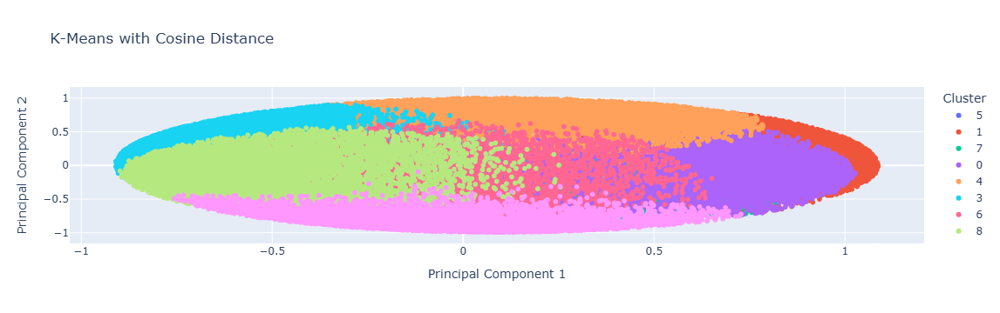

In [23]:
fig = px.scatter(resultsCos, x='pca1', y='pca2', color='clusters', labels={'clusters': 'Cluster', 'pca1': 'Principal Component 1', 'pca2': 'Principal Component 2'}, hover_data=['track_name', 'track_genre'], title='K-Means with Cosine Distance')
fig.show()